# CNN Image Classification
- In this notebook, I use a **Convolutional Neural Network** to classify 6 different images
- The dataset was from kaggle and can be viewed [here](https://www.kaggle.com/puneet6060/intel-image-classification/kernels)

In [1]:
import numpy as np
import pandas as pd
import cv2
from PIL import Image
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt 
import glob as gb
import os
import tqdm

# Loading in Training Datasets

In [2]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) : 
    for x , y in code.items() : 
        if n == y : 
            return x    

In [3]:
X_train = []
y_train = []
for folder in os.listdir('seg_train'):
    files = gb.glob(pathname=str('seg_train//' + folder + '/*jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image, (150,150))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [4]:
print('There are {} items in X_train'.format(len(X_train)))

There are 14034 items in X_train


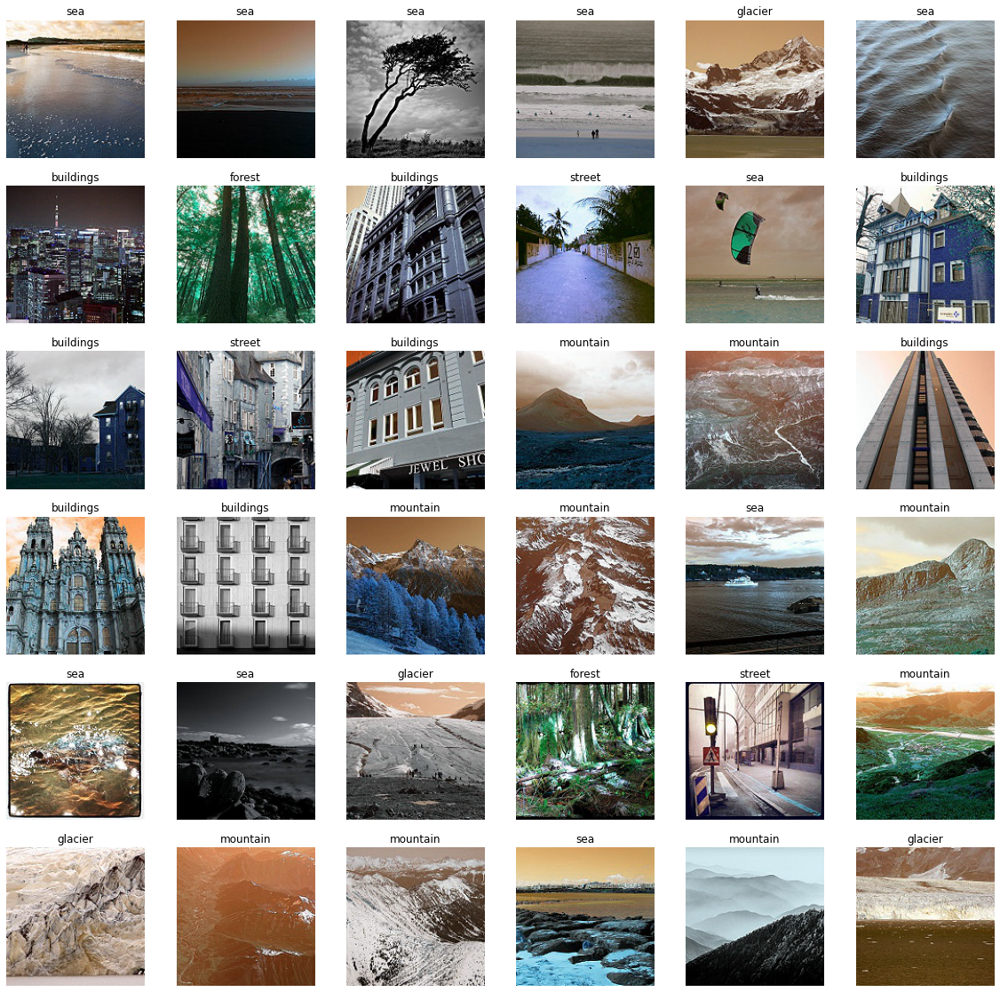

In [5]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(X_train), 36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

# Loading in Test dataset

In [4]:
X_test = []
y_test = []
for folder in os.listdir('seg_test'):
    files = gb.glob(pathname=str('seg_test//' + folder + '/*jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image, (150,150))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [5]:
print('There are {} items in X_test'.format(len(X_test)))

There are 3000 items in X_test


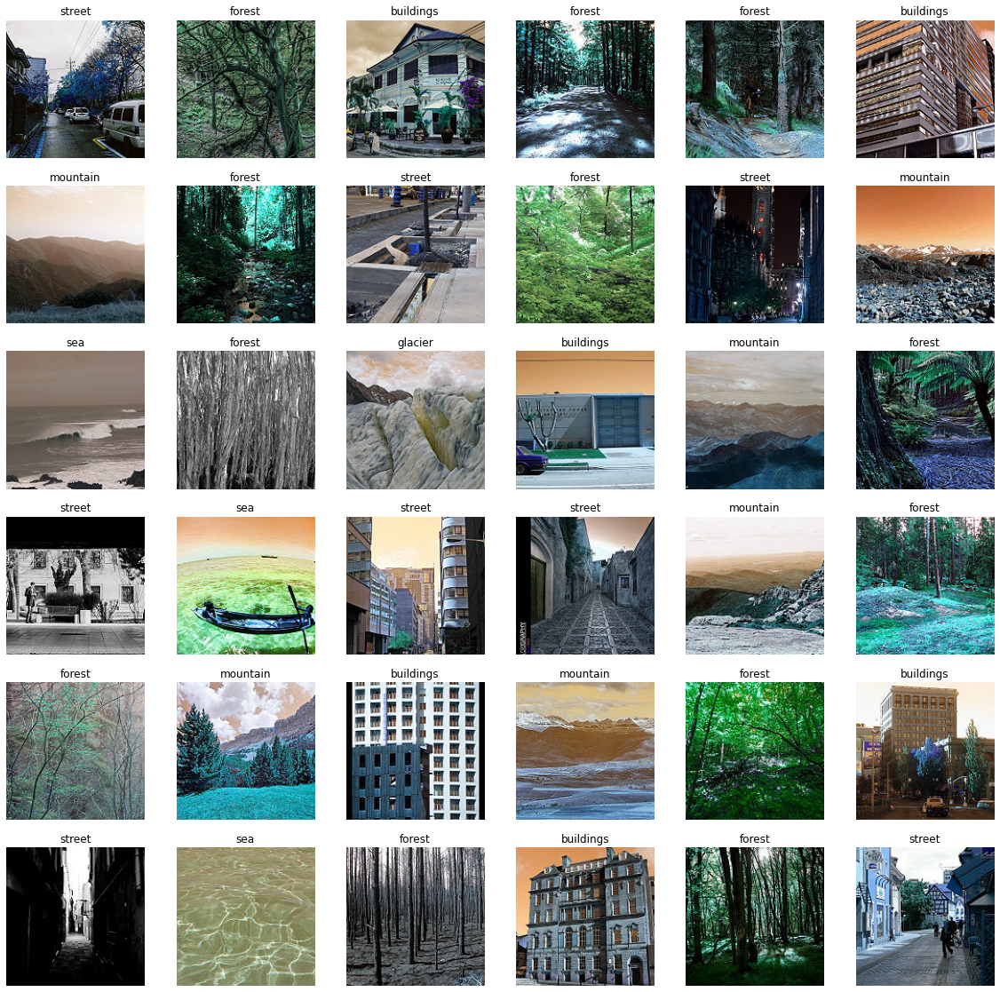

In [8]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(X_test), 36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

# Loading in the Prediction Dataset

In [6]:
X_pred = []
files = gb.glob(pathname=str('seg_pred//*jpg'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image, (150,150))
    X_pred.append(list(image_array))

In [7]:
print('There are {} items in X_pred'.format(len(X_pred)))

There are 7301 items in X_pred


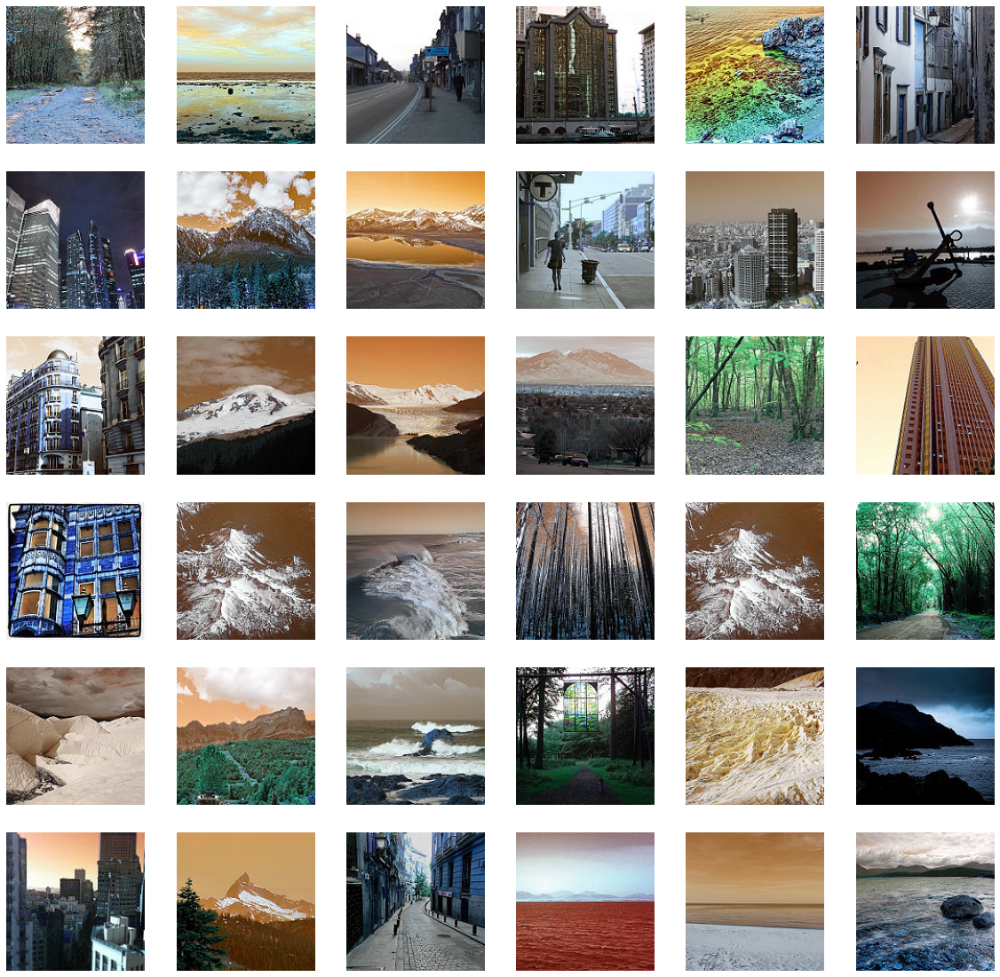

In [11]:
plt.figure(figsize=(20,20))
for n, i in enumerate(list(np.random.randint(0,len(X_pred), 36))):
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

# Building Model

In [8]:
from keras.models import Sequential
import tensorflow as tf
import keras
from keras.layers import Conv2D
from keras.layers import MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense

Using TensorFlow backend.


In [9]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 150, 150, 3)
X_test shape  is (3000, 150, 150, 3)
X_pred shape  is (7301, 150, 150, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


In [10]:
model = Sequential()
model.add(Conv2D(300, (3,3), padding='valid', activation='relu', input_shape = (150,150,3)))
model.add(MaxPooling2D(4,4))
model.add(Conv2D(200, (3,3), padding='valid', activation='relu'))
model.add(MaxPooling2D(4,4))
model.add(Conv2D(100, (3,3), padding='valid', activation='relu'))
model.add(MaxPooling2D(4,4))
model.add(Dense(120,activation='relu'))
model.add(Flatten())
model.add(Dense(6, activation='softmax'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 300)     8400      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 37, 37, 300)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 35, 35, 200)       540200    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 8, 8, 200)         0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 6, 6, 100)         180100    
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 1, 1, 100)         0         
_________________________________________________________________
dense_1 (Dense)              (None, 1, 1, 120)        

In [11]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [12]:
from keras.callbacks import ModelCheckpoint  

epochs = 5

checkpointer = ModelCheckpoint(filepath='weights.best.from_scratch.hdf5', 
                               verbose=1, save_best_only=True)

model.fit(X_train, y_train, 
          epochs=epochs, batch_size=80, callbacks=[checkpointer], verbose=1)

Epoch 1/5
14034/14034 [==============================] - 2755s 196ms/step - loss: 3.6087 - accuracy: 0.4728
Epoch 2/5


C:\Users\User\Anaconda3\envs\JasonEnv\lib\site-packages\keras\callbacks\callbacks.py:707: RuntimeWarning: Can save best model only with val_loss available, skipping.
  'skipping.' % (self.monitor), RuntimeWarning)


14034/14034 [==============================] - 2701s 192ms/step - loss: 0.8742 - accuracy: 0.6645
Epoch 3/5
14034/14034 [==============================] - 2349s 167ms/step - loss: 0.7575 - accuracy: 0.7193
Epoch 4/5
14034/14034 [==============================] - 2301s 164ms/step - loss: 0.6844 - accuracy: 0.7456
Epoch 5/5
14034/14034 [==============================] - 2200s 157ms/step - loss: 0.6291 - accuracy: 0.7666


In [13]:
ModelLoss, ModelAccuracy = model.evaluate(X_test, y_test)

print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy ))

3000/3000 [==============================] - 134s 45ms/step
Test Loss is 0.6870200448830922
Test Accuracy is 0.753333330154419


In [14]:
y_pred = model.predict(X_test)
y_result = model.predict(X_pred_array)

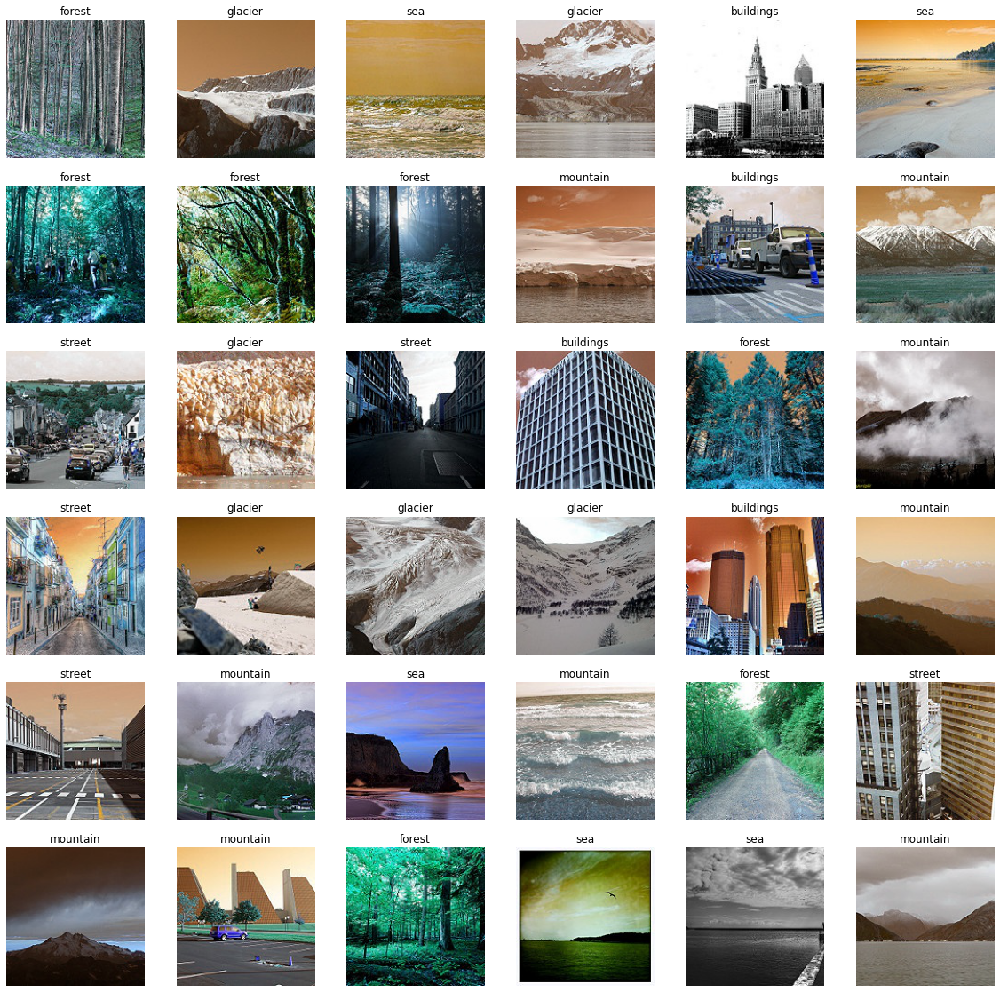

In [15]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))

# Conclusion
- The model I developed was determined to have around **75% accuracy** after only running 5 epochs. 
- Running for more epochs (~50) can significantly improve the accuracy, however my local machine was not powerful enough to do so.
- In the above code cell, you can see the model predicts the images decently well.
- However, the model has some trouble differentiating between **buildings** and **streets** as there are some images that have **both** street and buildings in it.